In [1]:
import sys
sys.path.append('..')

from modules import encoder

import spacy
from spacy import displacy
from sklearn.manifold import TSNE
import plotly.express as px
import pandas as pd
import numpy as np
import json
from pandas import json_normalize
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from tqdm import tqdm
tqdm.pandas()

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_colwidth', None)

/Users/kalyan/.pyenv/versions/3.7.3/envs/sciencemuseum/lib/python3.7/site-packages/tqdm/std.py:658: FutureWarning:

The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version



## 1. Load Data

In [2]:
data_folder = '../data/raw/wellcome/'

In [170]:
# create df
df = pd.DataFrame()

for idx in range(52):
    with open(data_folder + f'wellcome_all{idx+1}.json') as f:
        data = json.load(f)
    try:
        df = df.append(json_normalize(data['data']).set_index('id'))
    except Exception as e:
        print(e)

'data'


In [174]:
# process_df
cols_keep = ['type', 'attributes.categories', 'attributes.dates.DATE1', 'attributes.description', 'attributes.lifecycle.creation',
             'attributes.locations', 'attributes.name', 'attributes.options.option1', 'attributes.summary_title', 'attributes.title',
             'links.self', 'attributes.materials']
df = df[cols_keep]

df['category'] = df['attributes.categories'].apply(lambda row: row[0]['name'] if isinstance(row, list) else 'NaN')
df['name'] = df['attributes.name'].apply(lambda row: row[0]['value'] if isinstance(row, list) else 'NaN')
df['title'] = df['attributes.title'].apply(lambda row: row[0]['value'] if isinstance(row, list) else 'NaN')

df['description'] = ""
for idx, row in df.iterrows():
    desc = row['attributes.description']
    vals = []
    for item in desc:
        vals.append(item['value'] if 'value' in item else "")
        
    df.loc[idx, 'description'] = max(vals, key=len)
    
df = df.drop(columns=['attributes.categories', 'attributes.name', 'attributes.title', 'attributes.description', 'attributes.options.option1'])

In [175]:
df.head(1)

,type,attributes.dates.DATE1,attributes.lifecycle.creation,attributes.locations,attributes.summary_title,links.self,attributes.materials,category,name,title,description
id,,,,,,,,,,,
co8102855,objects,2010-03-31,"[{'date': [{'earliest': 1920, 'latest': 1950, 'primary': True, 'value': '1920-1950'}], 'maker': [{'@link': {'role': [{'value': 'maker'}], 'type': 'reference'}, 'admin': {'id': 'agent-34354', 'uid': 'cp34354', 'uuid': '20bb6a7c-865d-378d-8811-35a10e96cb31'}, 'summary_title': 'W D and H O Wills Limited'}], 'places': [{'@link': {'role': [{'value': 'made'}], 'type': 'reference'}, 'admin': {'id': 'place-139', 'uid': 'cd139', 'uuid': '9660ec71-ab89-3a8d-a4fa-31b90d197dc0'}, 'summary_title': 'England'}]}]","[{'@link': {'type': 'literal'}, 'admin': {'id': 'location-2239646', 'uuid': '56974fcc-9fc6-357b-8a5c-a60506065952'}, 'facilities': [{'@link': {'type': 'reference'}, 'admin': {'id': 'facility-62029', 'uid': 'cf62029', 'uuid': 'c805d997-7510-3365-80fd-1329304c7aca'}, 'summary_title': 'Science Museum, Medicine: The Wellcome Galleries'}], 'level1': 'S', 'level2': 'G29', 'level3': 'G2.2', 'level4': 'G2WN2', 'name': [{'primary': True, 'value': 'Science Museum, Medicine: The Wellcome Galleries'}, {'type': 'gallery', 'value': 'Medicine: The Wellcome Galleries'}, {'type': 'museum', 'value': 'Science Museum'}], 'purpose': 'on display', 'summary_title': 'Science Museum, Medicine: The Wellcome Galleries', 'value': 'Science Museum, Medicine: The Wellcome Galleries'}]",Packet of 10 'Gold Flake' cigarettes (cigarette packet),https://collection.sciencemuseumgroup.org.uk/objects/co8102855/packet-of-10-gold-flake-cigarettes-cigarette-packet,NaN,Smoking,cigarette packet,Packet of 10 'Gold Flake' cigarettes,"W D & H O Willis were one of a large number of cigarette and tobacco manufacturers based in England. This is a packet for ten 'Gold Flake' cigarettes, which were popular during the First World War with British soldiers in the trenches. Today, these cigarettes are only available in India."


## 2. NER

In [176]:
nlp = spacy.load("en_core_web_sm")

In [177]:
def get_entities(text):    
    doc = nlp(text)
    return [(ent.text, ent.label_, ent.start_char, ent.end_char, ent.kb_id_) for ent in doc.ents if ent.label_ != 'CARDINAL']

entity_df = pd.DataFrame()

for col in ['attributes.summary_title', 'title', 'description']:
    df[col+'.entities'] = df[col].apply(get_entities)

In [178]:
for i in range(3):
    doc = nlp(df.iloc[i]['description'])
    displacy.render(doc, style='ent', jupyter=True)
    print('---')

---


---


---


In [179]:
df[df['title'] == "Artificial arm, below-elbow prosthesis"]
df.index.get_loc('co476713')

16

In [180]:
df['description.entities'][17]

[('the London Ambulance Cycle Response Unit', 'ORG', 53, 93, ''),
 ('Cannondale', 'ORG', 103, 113, ''),
 ('Tom Lynch MBE', 'PERSON', 160, 173, ''),
 ('Cycle Response Unit', 'ORG', 175, 194, ''),
 ('British', 'NORP', 214, 221, '')]

### 2.1 Reformat entities

In [10]:
df_ent = df.copy()
for idx, row in tqdm(df_ent.iterrows(), total=len(df_ent)):
    doc = nlp(row['description'])
    
    # ent.text, ent.label_, ent.start_char, ent.end_char, ent.kb_id_
    
    for ent in doc.ents:
        col_title = f"ent_{ent.text}-{ent.label_}"
        
        df_ent.loc[idx, col_title] = f"({ent.start_char}, {ent.end_char})"


100%|██████████| 2550/2550 [17:34<00:00,  2.42it/s] 


In [181]:
#df_ent.to_pickle('../data/processed/wellcome1_entitycols.pkl')
df_ent = pd.read_pickle('../data/processed/wellcome1_entitycols.pkl')

In [183]:
df_ent.head()

type attributes.dates.DATE1  \
id                                          
co8102855  objects             2010-03-31   
co77704    objects             2010-03-31   
co8102856  objects             2010-03-31   
co77685    objects             2010-03-31   
co8102857  objects             2010-03-31   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         attributes.lifecycle.creation  \
id                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       
co8102855      [{'date': [{'earliest': 1920, 'latest': 1950, 'primary': True, 'value': '1920-1950'}], 'maker': [{'@link': {'role': [{'value': 'maker'}], 'type': 'reference'}, 'admin': {'id': 'agent-34354', 'uid': 'cp34354', 'uuid': '20bb6a7c-865d-378d-8811-35a10e96cb31'}, 'summary_title': 'W D and H O Wills Limited'}], 'places': [{'@link': {'role': [{'value': 'made'}], 'type': 'reference'}, 'admin': {'id': 'place-139', 'uid': 'cd139', 'uuid': '9660ec71-ab89-3a8d-a4fa-31b90d197dc0'}, 'summary_title': 'England'}]}]   
co77704              [{'date': [{'earliest': 1700, 'latest': 1936, 'primary': True, 'value': '1700-1936'}], 'maker': [{'@link': {'role': [{'value': 'maker'}], 'type': 'reference'}, 'admin': {'id': 'agent-21665', 'uid': 'cp21665', 'uuid': '2b819f5a-2e1d-3432-8d8a-a01bf2ab3f86'}, 'summary_title': 'Unknown maker'}], 'places': [{'@link': {'role': [{'value': 'made'}], 'type': 'reference'}, 'admin': {'id': 'place-679', 'uid': 'cd679', 'uuid': 'dc0dc0dd-35c6-3166-972b-d7161bae0bd3'}, 'summary_title': 'Unknown place'}]}]   
co8102856  [{'date': [{'earliest': 1920, 'latest': 1950, 'primary': True, 'value': '1920-1950'}], 'maker': [{'@link': {'role': [{'value': 'maker'}], 'type': 'reference'}, 'admin': {'id': 'agent-123357', 'uid': 'cp123357', 'uuid': '3408643d-8382-3675-908a-c5365355f6eb'}, 'summary_title': 'J Millhoff & Company Limited'}], 'places': [{'@link': {'role': [{'value': 'made'}], 'type': 'reference'}, 'admin': {'id': 'place-113', 'uid': 'cd113', 'uuid': '570507c0-09d4-3e9a-85da-284abeba102f'}, 'summary_title': 'London'}]}]   
co77685               [{'date': [{'earliest': 1818, 'latest': 1818, 'primary': True, 'value': '1818'}], 'maker': [{'@link': {'role': [{'value': 'maker'}], 'type': 'reference'}, 'admin': {'id': 'agent-109197', 'uid': 'cp109197', 'uuid': '965edc29-02be-31fe-bedb-0f59573fe001'}, 'summary_title': 'Francesco Calenzuoli'}], 'places': [{'@link': {'role': [{'value': 'made'}], 'type': 'reference'}, 'admin': {'id': 'place-381', 'uid': 'cd381', 'uuid': 'e22589d5-cafb-378f-8ddf-9214a3a2300c'}, 'summary_title': 'Florence'}]}]   
co8102857     [{'date': [{'earliest': 1920, 'latest': 1950, 'primary': True, 'value': '1920-1950'}], 'maker': [{'@link': {'role': [{'value': 'maker'}], 'type': 'reference'}, 'admin': {'id': 'agent-123359', 'uid': 'cp123359', 'uuid': 'ed65e3cf-5181-3a4c-bbab-a3ed2d0c4cec'}, 'summary_title': 'Abdulla & Company Limited'}], 'places': [{'@link': {'role': [{'value': 'made'}], 'type': 'reference'}, 'admin': {'id': 'place-113', 'uid': 'cd113', 'uuid': '570507c0-09d4-3e9a-85da-284abeba102f'}, 'summary_title': 'London'}]}]   

                                           

### 2.2 Plot relationships

In [182]:
df_binary = df_ent[[c for c in df_ent.columns if c.startswith('ent_')]].mask(~df_ent.isnull(), 1)
df_binary = df_binary.fillna(0)
df_binary.head()

ent_W D & H O Willis-ORG  ent_one-CARDINAL  ent_England-GPE  \
id                                                                       
co8102855                         1                 1                1   
co77704                           0                 0                0   
co8102856                         0                 0                0   
co77685                           0                 0                0   
co8102857                         0                 1                1   

           ent_ten-CARDINAL  ent_the First World War-EVENT  ent_British-NORP  \
id                                                                             
co8102855                 1                              1                 1   
co77704                   0                              0                 0   
co8102856                 0                              0                 0   
co77685                   0                              0                 0   
co8102857                 0                              0                 1   

           ent_Today-DATE  ent_India-GPE  ent_Latin-NORP  \
id                                                         
co8102855               1              1               0   
co77704                 0              0               1   
co8102856               0              0               0   
co77685                 0              0               0   
co8102857               0              0               0   

           ent_Tempus-WORK_OF_ART  ent_the 1800s-DATE  ent_Queen Mary-PERSON  \
id                                                                             
co8102855                       0                   0                      0   
co77704                         1                   1                      1   
co8102856                       0                   0                      0   
co77685                         0                   0                      0   
co8102857                       0                   0                      0   

           ent_1867-1953-DATE  ent_George V.-PERSON  \
id                                                    
co8102855                   0                     0   
co77704                     1                     1   
co8102856                   0                     0   
co77685                     0                     0   
co8102857                   0                     0   

           ent_Henry Wellcome-PERSON  ent_the 1930s-DATE  ent_De Reszke-ORG  \
id                                                                            
co8102855                          0                   0                  0   
co77704                            1                   1                  0   
co8102856                          0                   0                  1   
co77685                            0                   0                  0   
co8102857                          0                   0                  0   

           ent_Jean de Reszke-ORG  ent_1850-1925-DATE  ent_Polish-NORP  \
id                                                                       
co8102855                       0                   0                0   
co77704                         0                   0                0   
co8102856                       1                   1                1   
co77685                         0                   0                0   
co8102857                       0                   0                0   

           ent_J Millhoff-PERSON  ent_Russian-NORP  ent_London-GPE  \
id                                                                   
co8102855                      0                 0               0   
co77704                        0                 0               0   
co8102856                      1                 1               1   
co77685                        0                 0               0   
co8102857                      0                 0               0   


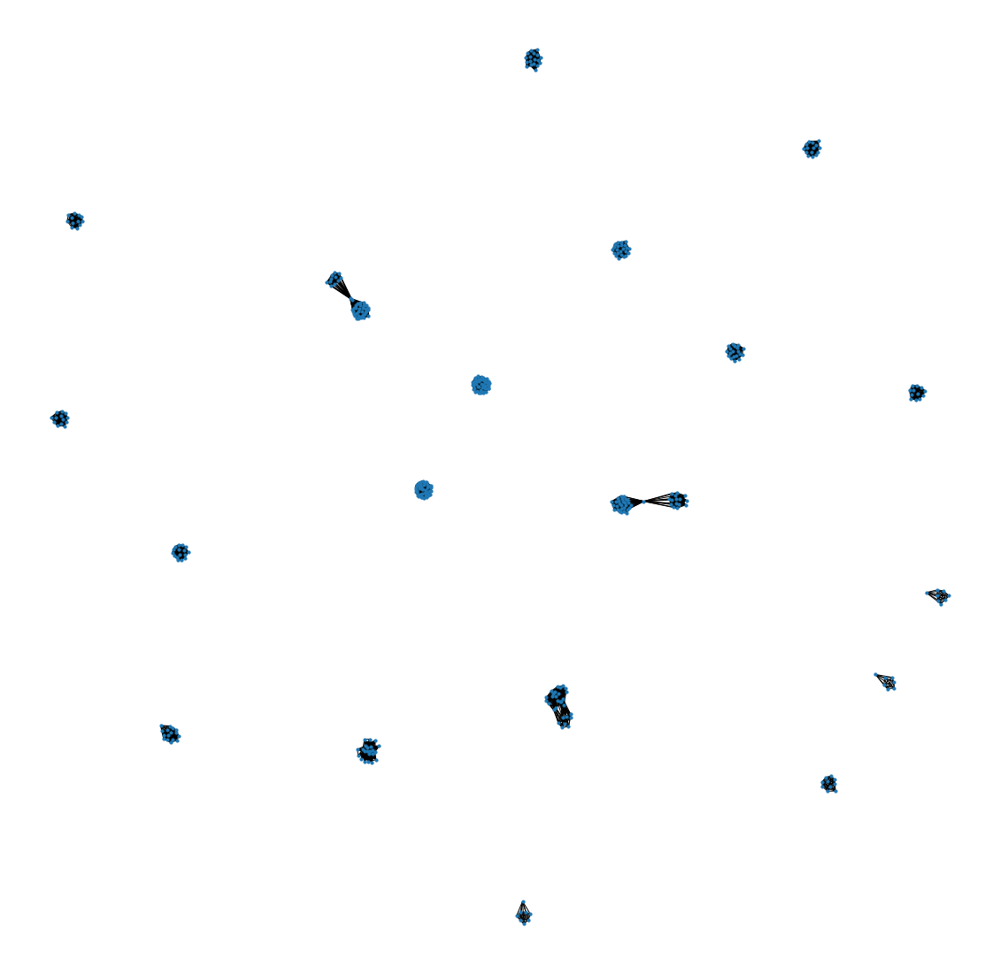

In [78]:
corr_mat = pd.DataFrame(np.corrcoef(df_binary.T.values, rowvar=False), index=df.index.values, columns=df.index.values)

def visualise_graph(corr_mat, threshold=0.8):
    links = corr_mat.stack().reset_index()
    links.columns = ['var1', 'var2','value']
    links

    # Keep only correlation over a threshold and remove self correlation (cor(A,A)=1)
    links_filtered=links.loc[ (links['value'] > threshold) & (links['var1'] != links['var2']) ]
    links_filtered

    # Build your graph
    G=nx.from_pandas_edgelist(links_filtered, 'var1', 'var2')

    # remove nodes with only one connection
    to_remove = [node for node,degree in G.degree() if degree < 10]
    G.remove_nodes_from(to_remove)

    # Plot the network:
    plt.subplots(figsize=(20,20))
    nx.draw(G, with_labels=False, node_size=10, edge_color='black', linewidths=1) 
    
visualise_graph(corr_mat)

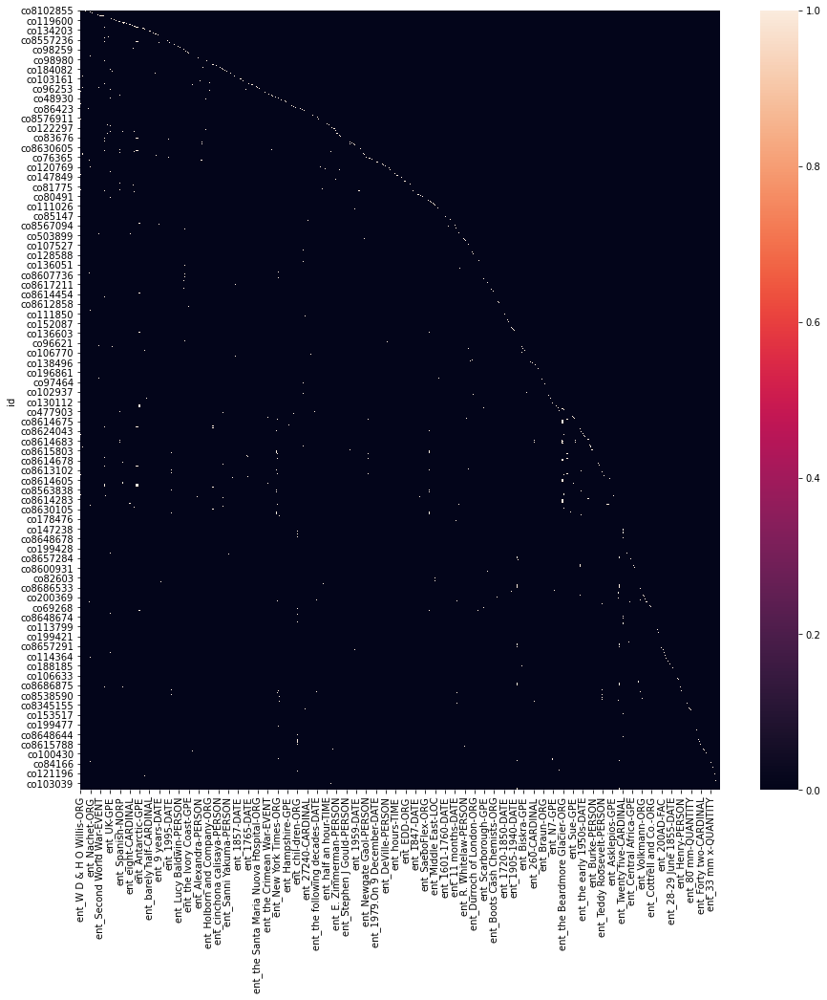

In [15]:
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(df_binary, annot=False)

### 2.3 Clustering to show groups of entities

In [25]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=30, random_state=0).fit(df_binary)

In [26]:
#df_cluster = df_binary.copy()
cluster_labels = kmeans.predict(df_binary)
df['cluster'] = cluster_labels
#df.loc[df['cluster']==4, 'title']

In [33]:
df_cluster = df_binary.copy()
df_cluster['cluster'] = cluster_labels

df_cluster = df_cluster[[col for col in df_cluster.columns if not col.endswith('LANGUAGE') or col.endswith('CARDINAL') or col.endswith('ORDINAL') or ('today' in col)]]


In [34]:
## from sklearn.manifold import TSNE
ents_2d = TSNE(n_components=2).fit_transform(df_cluster[[col for col in df_cluster.columns if col.startswith('ent')]])
df['ent_1d'] = ents_2d[:,0]
df['ent_2d'] = ents_2d[:,1]


In [35]:
df['desc_has_entities'] = (df['description.entities'].apply(lambda item: len(item) > 0))
df['cluster'] = df['cluster'].astype('category')

In [37]:
df_cluster.groupby('cluster').sum()

ent_W D & H O Willis-ORG  ent_one-CARDINAL  ent_England-GPE  \
cluster                                                                
0                               0                 0                0   
1                               0                 0                1   
2                               0                 6                1   
3                               0                 0                0   
4                               0                 0                0   
5                               0                15               50   
6                               0                 0                0   
7                               0                 0                1   
8                               1                62               69   
9                               0                 0                0   
10                              0                 3                0   
11                              0                 3                0   
12                              0                 0                3   
13                              0                 1                0   
14                              0                 0                0   
15                              0                 0                5   
16                              0                 0                0   
17                              0                 0                3   
18                              0                 0               16   
19                              0                 1                2   
20                              0                 0                0   
21                              0                 0                0   
22                              0                 6                0   
23                              0                 0                0   
24                              0                 5                1   
25                              0                 8                0   
26                              0                 0                0   
27                              0                 0                0   
28                              0                 0                0   
29                              0                 0                0   

         ent_ten-CARDINAL  ent_the First World War-EVENT  ent_British-NORP  \
cluster                                                                      
0                       0                              0                 0   
1                       0                              0                 0   
2                       0                              0                 3   
3                       0                              0                 0   
4                       0                              0                 0   
5                       0                              0                 3   
6                       0                              0                 0   
7                       0                              0                 0   
8                       2                             18                46   
9                       0                              0                 0   
10                      0                              0                 0   
11                      0                              0                 0   
12                      0                              0                 0   
13                      0                              0                 0   
14                      0                              0                 0   
15                      0                              0                 0   
16                      0                              0                 0   
17                      0                              0                 0   
18                      0                              0                 0   
19                      0                              1          

In [40]:
df.columns

Index(['type', 'attributes.dates.DATE1', 'attributes.lifecycle.creation',
       'attributes.locations', 'attributes.summary_title', 'links.self',
       'attributes.materials', 'category', 'name', 'title', 'description',
       'attributes.summary_title.entities', 'title.entities',
       'description.entities', 'cluster', 'ent_1d', 'ent_2d',
       'desc_has_entities'],
      dtype='object')

In [36]:
fig = px.scatter(df[df['desc_has_entities']==True], x='ent_1d', y='ent_2d', color='cluster', hover_data=['title', 'description.entities'])#, color='intent', hover_data=['utterance'])
fig.show()


### 2.4 Visualising Links Between Categories

In [74]:
df_catbin = pd.merge(df_binary,df['category'], left_index=True, right_index=True)

In [75]:
cat_sum = df_catbin.groupby('category').sum()
# drop potentially meaningless entities
cat_sum = cat_sum[[col for col in cat_sum.columns if not col.endswith('CARDINAL') or col.endswith('ORDINAL') or ('today' in col)]]

In [91]:
links

,var1,var2,value
0,Anaesthesiology,Anaesthesiology,1.000000
1,Anaesthesiology,Anatomy & Pathology,0.033531
2,Anaesthesiology,Archive,-0.007367
3,Anaesthesiology,Art,0.111318
4,Anaesthesiology,Asian Medicine,0.011459
...,...,...,...
2299,Wellcome Medals,Veterinary Medicine,-0.008282
2300,Wellcome Medals,Water Supply & Sanitation,-0.003622
2301,Wellcome Medals,Water Supply Metering,-0.005377
2302,Wellcome Medals,Wellcome (general),-0.006017


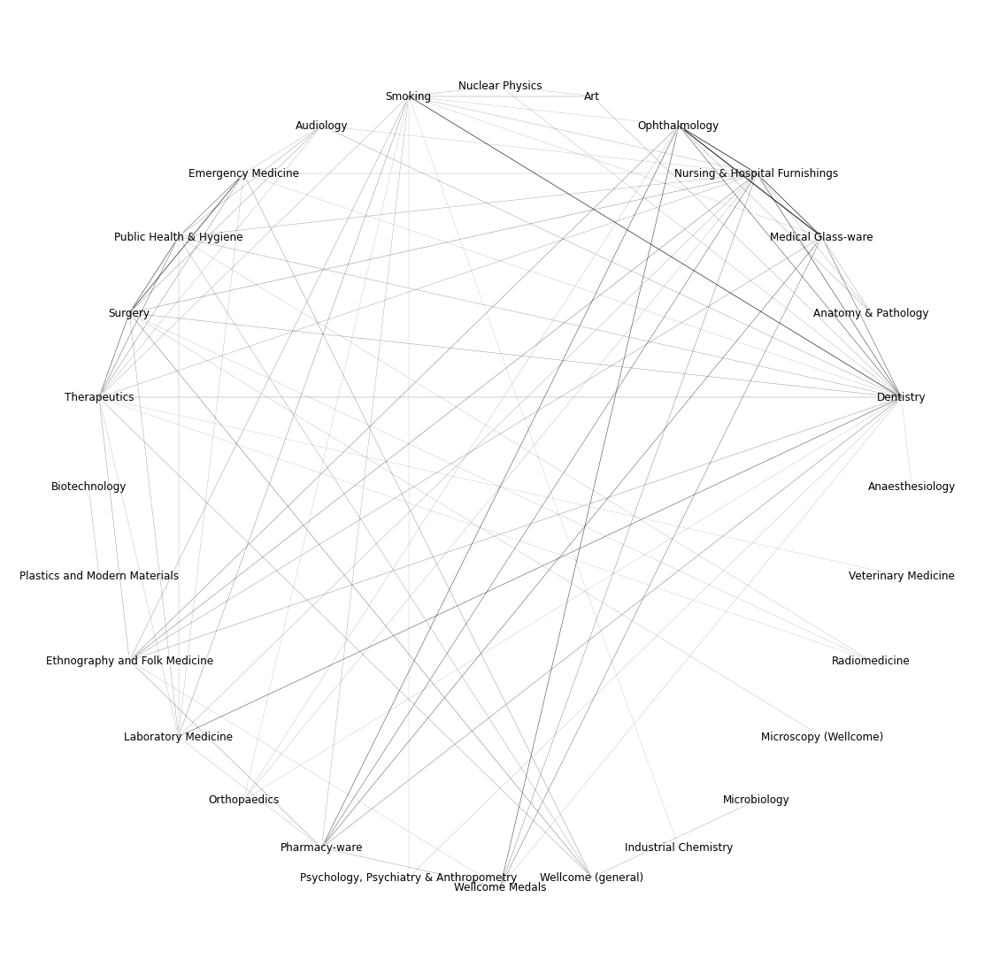

In [169]:
cat_sum_corr = pd.DataFrame(np.corrcoef(cat_sum.T.values, rowvar=False), index=cat_sum.index.values, columns=cat_sum.index.values)

links = cat_sum_corr.stack().reset_index()
links.columns = ['var1', 'var2','value']
links

# Keep only correlation over a threshold and remove self correlation (cor(A,A)=1)
links_filtered=links.loc[ (links['value'] > 0.2) & (links['var1'] != links['var2']) ]
links_filtered

# Build your graph
G=nx.from_pandas_edgelist(links_filtered, 'var1', 'var2', edge_attr='value')

# remove nodes with only one connection
#to_remove = [node for node,degree in G.degree() if degree < 10]
#G.remove_nodes_from(to_remove)

# PLOT
plt.subplots(figsize=(20,20))
pos=nx.circular_layout(G) # kamada_kawai_layout, circular_layout

# custom weights
all_weights = []
for (node1,node2,data) in G.edges(data=True):
    all_weights.append(data['value'])
    
unique_weights = list(set(all_weights))

for weight in unique_weights:
    #4 d. Form a filtered list with just the weight you want to draw
    weighted_edges = [(node1,node2) for (node1,node2,edge_attr) in G.edges(data=True) if edge_attr['value']==weight]
    width = weight*1.5
    #width = weight*len(links)/sum(all_weights)
    nx.draw_networkx_edges(G,pos,edgelist=weighted_edges,width=width, alpha=weight*1.5) # weighted

# Plot the network:
#nx.draw(G, with_labels=True, pos=pos, fontsize=14, alpha=0.4)#, node_size=10, edge_color='black', linewidths=1) 
nx.draw_networkx_nodes(G, pos, node_color="w", node_size=200, alpha=0.4)
#nx.draw_networkx_edges(G, pos, alpha=0.4, node_size=0, width=1, edge_color="k") # not weighted
nx.draw_networkx_labels(G, pos, fontsize=16);

plt.axis('off');
cut = 1.2
xmax= cut*max(xx for xx,yy in pos.values())
ymax= cut*max(yy for xx,yy in pos.values())
plt.xlim(-xmax,xmax)
plt.ylim(0-ymax,ymax)

plt.savefig("../data/figures/category_network.png", bbox_inches="tight")

In [194]:
def search_entity(entity):
    ids = df_ent[~df_ent[entity].isna()].index.tolist()
    
    return ids

def search_entities(entity_list):
    if len(entity_list) == 1:
        return search_entity(entity_list[0])
    else:
        search_res = [set(search_entity(entity)) for entity in entity_list]
        return search_res[0].intersection(*search_res[1:])
    
search_entities(['ent_England-GPE', 'ent_British-NORP'])

{'co103760', 'co103780', 'co104464', 'co8102855', 'co8102857', 'co8609454'}

## 3. Experimenting with Word Embeddings

### 3.1 Generate

In [186]:
use = encoder.USEEncoder()

In [192]:
title_embeddings = use.encode(df['title'].tolist())
df['title_emb'] = [item for item in title_embeddings]
df_ent['title_emb'] = df['title_emb']

### 3.2 Visualise

In [190]:
embeddings_2d = TSNE(n_components=2).fit_transform(df['title_emb'].tolist())
df['title_X0'] = embeddings_2d[:,0]
df['title_X1'] = embeddings_2d[:,1]

df_ent['title_X0'] = embeddings_2d[:,0]
df_ent['title_X1'] = embeddings_2d[:,1]

In [29]:
fig = px.scatter(df, x='title_X0', y='title_X1', color='category', hover_data=['title'])
fig.show()

### 3.3 Find nearest neighbours

In [14]:
from scipy.spatial import KDTree

In [15]:
tree = KDTree(df['title_emb'].tolist())

In [16]:
def get_nearest_neighbours(id_, k=5):
    nn_inds = tree.query(df.loc[id_, 'title_emb'], k)
    query_res = df.iloc[nn_inds[1]][['title', 'category', 'title.entities']].copy()
    query_res['distance'] = nn_inds[0]
    return query_res

get_nearest_neighbours('co8594796', 10)

,title,category,title.entities,distance
id,,,,
co8594796,Prosthetic limbs for child affected by Thalidomide,Orthopaedics,[],0.000000
co8594795,Prosthetic limbs for a child affected by thalidomide,Orthopaedics,[],0.163952
co8594793,"Pair of prosthetic limbs, for Thalidomide affected 9-year old child",Orthopaedics,[],0.390837
co8594797,Prosthetic limbs for a child afffected by thalidomide,Orthopaedics,[],0.400235
co8594794,"Pair of prosthetic limbs, for Thalidomide affected 4-year old child",Orthopaedics,[],0.406851
co8024212,Pair of artificial legs for a child affected by the drug thalidomide,Orthopaedics,[],0.598757
co8702389,Thalidomide prosthesis for left and right arms,Orthopaedics,[],0.604484
co476713,"Artificial arm, below-elbow prosthesis",Orthopaedics,[],0.655865
co8024943,"Crash helmet, made for child affected by the drug thalidomide",Orthopaedics,[],0.715057


## 4. Export Data

In [193]:
#df.to_pickle('../data/processed/wellcome1.pkl')
df_ent.to_pickle('../data/processed/wellcome1_entitycols.pkl')